<a href="https://colab.research.google.com/github/deepaksaipendyala/Detection-of-Shadow-cast-by-Oil-Tank-and-its-Volume-Estimation/blob/main/Dip_eval3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Introduction**:
A shadow appears on an area when the light from a source cannot reach the area due to obstruction by an object.

Oil storage tanks play an important role in the global economy. Crude oil is stored in tanks at many points between extraction and sale. Storage tanks are also used by nations to stockpile oil reserves. The volume of oil in storage is an important economic indicator. It indicates which oil producing nations are increasing or decreasing production and gives a window into the global demand for energy. At the same time, oil storage information is not transparent. Nations may hide information about oil production, consumption and storage for economic or military reasons. For this reason, companies like Planet and Orbital Insight have made a business of collecting satellite imagery of oil storage tanks and estimating reserve volumes.

# **Problem Statement**: 
Estimate the volume of oil in Floating roof tank oil containers using the shadow dimensions. The dataset corresponding to this problem statement has been taken from Kaggle.


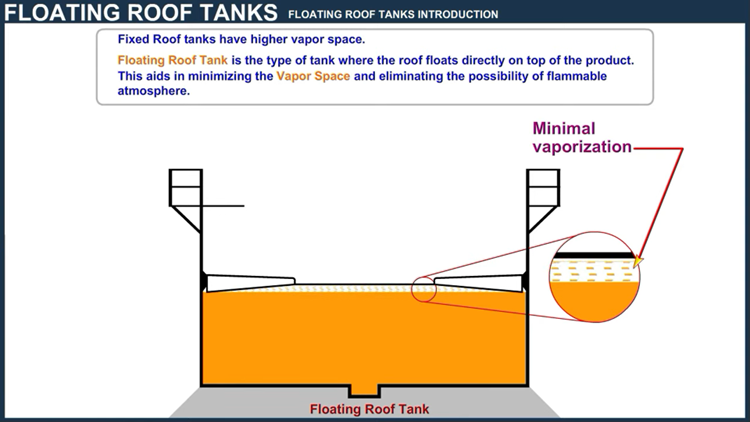

In [63]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d

In [64]:
!wget  https://www.kaggleusercontent.com/kf/15201520/eyJhbGciOiJkaXIiLCJlbmMiOiJBMTI4Q0JDLUhTMjU2In0..IRfJkZi004S0aF8r1Srz9A.gDnn1Of3SCx0jnLK_F-93MeXFih22XyqMrDDbEOBLdOZ55V-s1dK-bLCChq7gRZ24CzODKleQufNKqGpESLnr5p_mPDY2BC-8TsC1SGwmNoPBfH0Fq6hbNjRsQ90r-Hk0bx2hIp8-msn2riamd2e6jXRO-tOPiFQN3GVCdHduG5mjyz17Brdbx51nc5i7bDAH0-LR_ShgqsaqJHMTZuA1aJznNw0DcsP8xZKPvZC1waRmqA07VUVID0jx7Y6kT7YLYl0COpzzljctj2Hx7XqzwtU1c_M7UsIn6qKT6efOPeWeV8noUXPICIFFpFxEdSIcuqafdEdKc_bdHtWgB_Jzp8BAjNqFBYPpP0Os6OukJp62IxwXJbceB0l7ECbbJQmgkd5_OXpsuBfcmpFVs-nT1Z6457CN0prCLSx5Jgo8R-iNF9m_7afzmFyjasqBBZgehN8Bq8vTdnLBqu2S9vAShezEEf3GRb7i63sM9NX6UuDl1AL1iZFXlnSrzFkvF5OpZCXXJQKOAtlulMUrN0d28ZK8lam0zl6HqTk5NhT3D0yGUH_W1qVTll42hVxSV_01cz-Vhbt-4fQ7tRxBYBsLfb03XoE2SbcI77ktJdvBmijARgTVsyLTtMeRdQRGX1MHRX75LcBdKImapUB-KIjNpKQq3nmle2Vbbljvhf-rYQ.1Xf52yjjjKp-V6EmVScXiA/__results___files/__results___21_0.png \
      -O tank.png
!wget https://www.kaggleusercontent.com/kf/15201520/eyJhbGciOiJkaXIiLCJlbmMiOiJBMTI4Q0JDLUhTMjU2In0..IRfJkZi004S0aF8r1Srz9A.gDnn1Of3SCx0jnLK_F-93MeXFih22XyqMrDDbEOBLdOZ55V-s1dK-bLCChq7gRZ24CzODKleQufNKqGpESLnr5p_mPDY2BC-8TsC1SGwmNoPBfH0Fq6hbNjRsQ90r-Hk0bx2hIp8-msn2riamd2e6jXRO-tOPiFQN3GVCdHduG5mjyz17Brdbx51nc5i7bDAH0-LR_ShgqsaqJHMTZuA1aJznNw0DcsP8xZKPvZC1waRmqA07VUVID0jx7Y6kT7YLYl0COpzzljctj2Hx7XqzwtU1c_M7UsIn6qKT6efOPeWeV8noUXPICIFFpFxEdSIcuqafdEdKc_bdHtWgB_Jzp8BAjNqFBYPpP0Os6OukJp62IxwXJbceB0l7ECbbJQmgkd5_OXpsuBfcmpFVs-nT1Z6457CN0prCLSx5Jgo8R-iNF9m_7afzmFyjasqBBZgehN8Bq8vTdnLBqu2S9vAShezEEf3GRb7i63sM9NX6UuDl1AL1iZFXlnSrzFkvF5OpZCXXJQKOAtlulMUrN0d28ZK8lam0zl6HqTk5NhT3D0yGUH_W1qVTll42hVxSV_01cz-Vhbt-4fQ7tRxBYBsLfb03XoE2SbcI77ktJdvBmijARgTVsyLTtMeRdQRGX1MHRX75LcBdKImapUB-KIjNpKQq3nmle2Vbbljvhf-rYQ.1Xf52yjjjKp-V6EmVScXiA/__results___files/__results___29_0.png \
      -O tank1.png
!wget https://www.kaggleusercontent.com/kf/15201520/eyJhbGciOiJkaXIiLCJlbmMiOiJBMTI4Q0JDLUhTMjU2In0..IRfJkZi004S0aF8r1Srz9A.gDnn1Of3SCx0jnLK_F-93MeXFih22XyqMrDDbEOBLdOZ55V-s1dK-bLCChq7gRZ24CzODKleQufNKqGpESLnr5p_mPDY2BC-8TsC1SGwmNoPBfH0Fq6hbNjRsQ90r-Hk0bx2hIp8-msn2riamd2e6jXRO-tOPiFQN3GVCdHduG5mjyz17Brdbx51nc5i7bDAH0-LR_ShgqsaqJHMTZuA1aJznNw0DcsP8xZKPvZC1waRmqA07VUVID0jx7Y6kT7YLYl0COpzzljctj2Hx7XqzwtU1c_M7UsIn6qKT6efOPeWeV8noUXPICIFFpFxEdSIcuqafdEdKc_bdHtWgB_Jzp8BAjNqFBYPpP0Os6OukJp62IxwXJbceB0l7ECbbJQmgkd5_OXpsuBfcmpFVs-nT1Z6457CN0prCLSx5Jgo8R-iNF9m_7afzmFyjasqBBZgehN8Bq8vTdnLBqu2S9vAShezEEf3GRb7i63sM9NX6UuDl1AL1iZFXlnSrzFkvF5OpZCXXJQKOAtlulMUrN0d28ZK8lam0zl6HqTk5NhT3D0yGUH_W1qVTll42hVxSV_01cz-Vhbt-4fQ7tRxBYBsLfb03XoE2SbcI77ktJdvBmijARgTVsyLTtMeRdQRGX1MHRX75LcBdKImapUB-KIjNpKQq3nmle2Vbbljvhf-rYQ.1Xf52yjjjKp-V6EmVScXiA/__results___files/__results___62_0.png \
      -O tank2.png  

--2023-01-10 05:09:03--  https://www.kaggleusercontent.com/kf/15201520/eyJhbGciOiJkaXIiLCJlbmMiOiJBMTI4Q0JDLUhTMjU2In0..IRfJkZi004S0aF8r1Srz9A.gDnn1Of3SCx0jnLK_F-93MeXFih22XyqMrDDbEOBLdOZ55V-s1dK-bLCChq7gRZ24CzODKleQufNKqGpESLnr5p_mPDY2BC-8TsC1SGwmNoPBfH0Fq6hbNjRsQ90r-Hk0bx2hIp8-msn2riamd2e6jXRO-tOPiFQN3GVCdHduG5mjyz17Brdbx51nc5i7bDAH0-LR_ShgqsaqJHMTZuA1aJznNw0DcsP8xZKPvZC1waRmqA07VUVID0jx7Y6kT7YLYl0COpzzljctj2Hx7XqzwtU1c_M7UsIn6qKT6efOPeWeV8noUXPICIFFpFxEdSIcuqafdEdKc_bdHtWgB_Jzp8BAjNqFBYPpP0Os6OukJp62IxwXJbceB0l7ECbbJQmgkd5_OXpsuBfcmpFVs-nT1Z6457CN0prCLSx5Jgo8R-iNF9m_7afzmFyjasqBBZgehN8Bq8vTdnLBqu2S9vAShezEEf3GRb7i63sM9NX6UuDl1AL1iZFXlnSrzFkvF5OpZCXXJQKOAtlulMUrN0d28ZK8lam0zl6HqTk5NhT3D0yGUH_W1qVTll42hVxSV_01cz-Vhbt-4fQ7tRxBYBsLfb03XoE2SbcI77ktJdvBmijARgTVsyLTtMeRdQRGX1MHRX75LcBdKImapUB-KIjNpKQq3nmle2Vbbljvhf-rYQ.1Xf52yjjjKp-V6EmVScXiA/__results___files/__results___21_0.png
Resolving www.kaggleusercontent.com (www.kaggleusercontent.com)... 35.190.26.106
Connecting to www.kaggleuserco

In [ ]:
from skimage import data
from skimage import filters
from skimage import exposure
from skimage import measure
from skimage import segmentation
from skimage import morphology
from skimage import color

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d


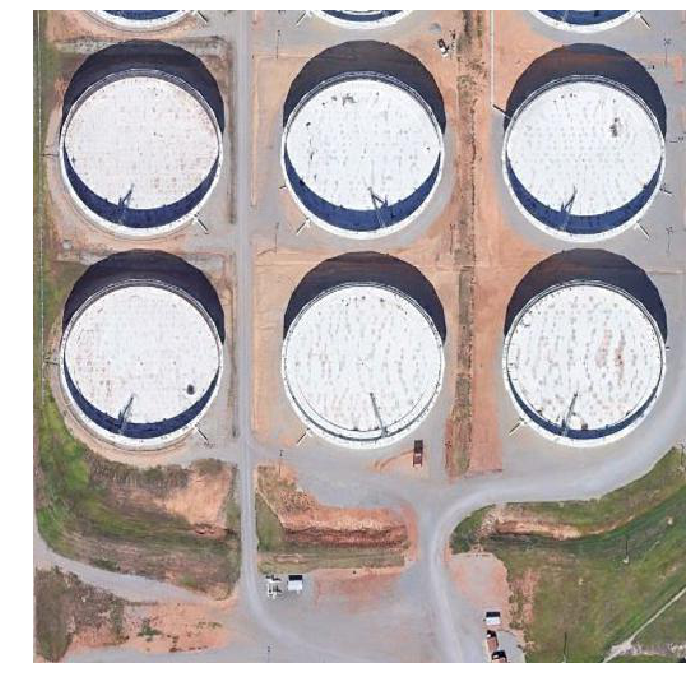

In [ ]:
imag = 'tank.png'
img = cv2.imread(imag)
s=img.shape
imgg = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(img)

# We first create two versions of the image - one in HSV color space and one in LAB color space

In [ ]:
hsv = color.rgb2hsv(img)
H = hsv[:,:,0]
S = hsv[:,:,1]
V = hsv[:,:,2]

lab = color.rgb2lab(img)
l1 = lab[:,:,0]
l2 = lab[:,:,1]
l3 = lab[:,:,2]

# These are the channels from the converted images. Note which channels show a strong contrast between shadow regions and non-shadow regions

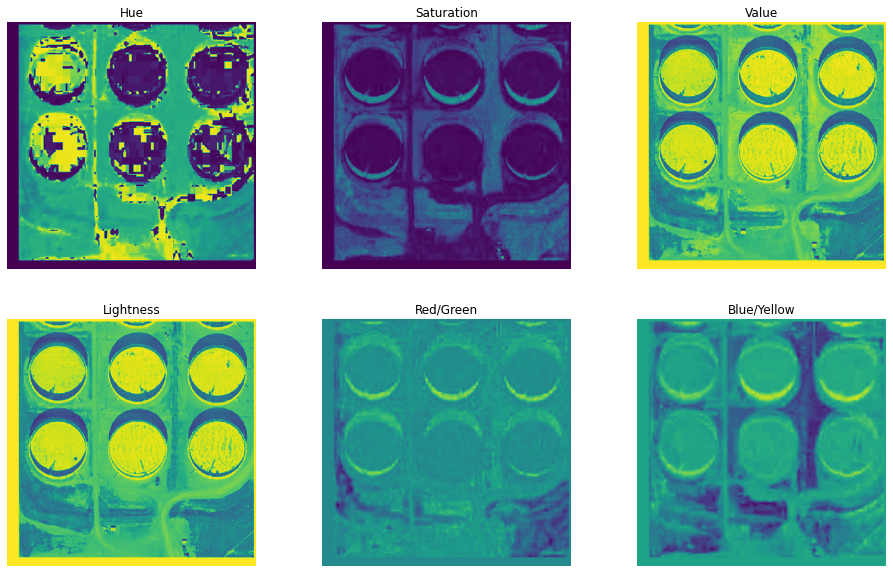

In [ ]:
fig, axes = plt.subplots(2, 3, figsize=(16,10))

axes[0][0].imshow(H)
axes[0][0].set_title('Hue')

axes[0][1].imshow(S)
axes[0][1].set_title('Saturation')

axes[0][2].imshow(V)
axes[0][2].set_title('Value')

axes[1][0].imshow(l1)
axes[1][0].set_title('Lightness')

axes[1][1].imshow(l2)
axes[1][1].set_title('Red/Green')

axes[1][2].imshow(l3)
axes[1][2].set_title('Blue/Yellow');

for ax in axes.flat:
    ax.axis('off')

Many methods have been proposed for ratioing these channels to enhance shadows. The  normalized saturation-value difference index (NSVDI) algorithm proposes $\frac{S-V}{S+V}$. The paper [Estimating the Volume of Oil Tanks Based on High-Resolution Remote Sensing](https://www.mdpi.com/2072-4292/11/7/793/pdf) which explicitly deals with oil tanks suggests $\frac{H+1}{V+1}$.

We found the $\frac{H+1}{V+1}$ was thrown off by strong artifacts in the H channel, likely due to the source images being RGB jpeg images saved from Google Earth rather than real high resolution satellite photography. The $\frac{S-V}{S+V}$ method worked well on some images but failed on others.

Experimentally I found the ratio $\frac{-(l1 + l3)}{V + 1}$ worked well, where $l1$ and $l3$ are the first and third channels of the LAB color space image.

In [ ]:
c1 = (H+1)/(V+1)
c2 = (S-V)/(S+V)
c3 = -(l1+l3)/(V+1)

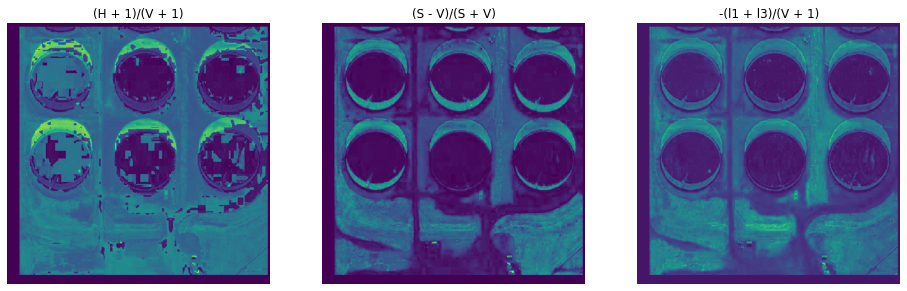

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(16,6))
axes[0].imshow(c1)
axes[0].set_title('(H + 1)/(V + 1)')
axes[1].imshow(c2)
axes[1].set_title('(S - V)/(S + V)')
axes[2].imshow(c3)
axes[2].set_title('-(l1 + l3)/(V + 1)');

for ax in axes.flat:
    ax.axis('off')

The enhanced image is filtered by thresholding. I found the minimum threshold was often too stringent, while the mean threshold was too permissive. a combination of `0.6 * minimum_threshold + 0.4 * mean_threshold` works well

In [ ]:
t1 = filters.threshold_minimum(c3)
t2 = filters.threshold_mean(c3)

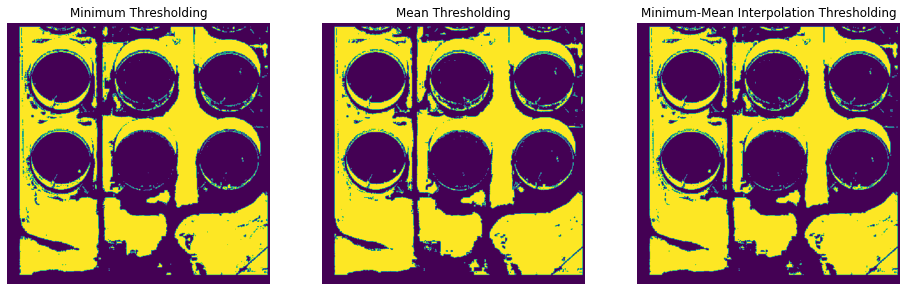

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(16,6))
axes[0].imshow(c3 > t1)
axes[0].set_title('Minimum Thresholding')
axes[1].imshow(c3 > t2)
axes[1].set_title('Mean Thresholding')
axes[2].imshow(c3 > (0.6*t1 + 0.4*t2))
axes[2].set_title('Minimum-Mean Interpolation Thresholding')

for ax in axes.flat:
    ax.axis('off')

The thresholded image is then processed with morphological operations. These operations are:

* 1. Hessian Filter - cleans up noise and line artifacts from white pipes which appear in many images
* 2. Clear Border - clears contours from surrounding tanks
* 3. Morphological Closing - helps separate shapes
* 4. Area Closing - fills small holes
* 5. Morphological Labeling - labels features

In [ ]:
tank_thresh = c3 > (0.6*t1 + 0.4*t2)

label_1 = filters.hessian(tank_thresh)
label_2 = segmentation.clear_border(filters.hessian(tank_thresh))
label_3 = morphology.closing(segmentation.clear_border(filters.hessian(tank_thresh)))
label_4 = morphology.area_closing(morphology.closing(segmentation.clear_border(filters.hessian(tank_thresh))))
label_image = measure.label(morphology.area_closing(morphology.closing(
            segmentation.clear_border(filters.hessian(tank_thresh)))))

<ipython-input-50-c48c672abd20>:3: FutureWarning: Previously, hessian implicitly used 'constant' as the border mode when dealing with the edge of the array. The new behavior is 'reflect'. To recover the old behavior, use mode='constant'. To avoid this warning, please explicitly set the mode.
  label_1 = filters.hessian(tank_thresh)
<ipython-input-50-c48c672abd20>:4: FutureWarning: Previously, hessian implicitly used 'constant' as the border mode when dealing with the edge of the array. The new behavior is 'reflect'. To recover the old behavior, use mode='constant'. To avoid this warning, please explicitly set the mode.
  label_2 = segmentation.clear_border(filters.hessian(tank_thresh))
<ipython-input-50-c48c672abd20>:5: FutureWarning: Previously, hessian implicitly used 'constant' as the border mode when dealing with the edge of the array. The new behavior is 'reflect'. To recover the old behavior, use mode='constant'. To avoid this warning, please explicitly set the mode.
  label_3 = 

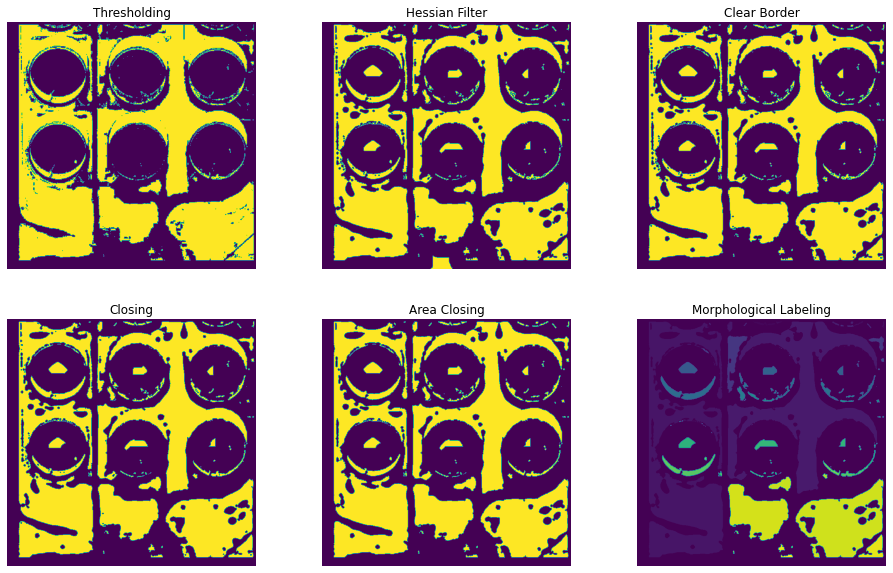

In [ ]:
fig, axes = plt.subplots(2, 3, figsize=(16,10))

axes[0][0].imshow(tank_thresh)
axes[0][0].set_title('Thresholding')
axes[0][1].imshow(label_1)
axes[0][1].set_title('Hessian Filter')
axes[0][2].imshow(label_2)
axes[0][2].set_title('Clear Border')
axes[1][0].imshow(label_3)
axes[1][0].set_title('Closing')
axes[1][1].imshow(label_4)
axes[1][1].set_title('Area Closing')
axes[1][2].imshow(label_image)
axes[1][2].set_title('Morphological Labeling')

for ax in axes.flat:
    ax.axis('off')

# Image 2

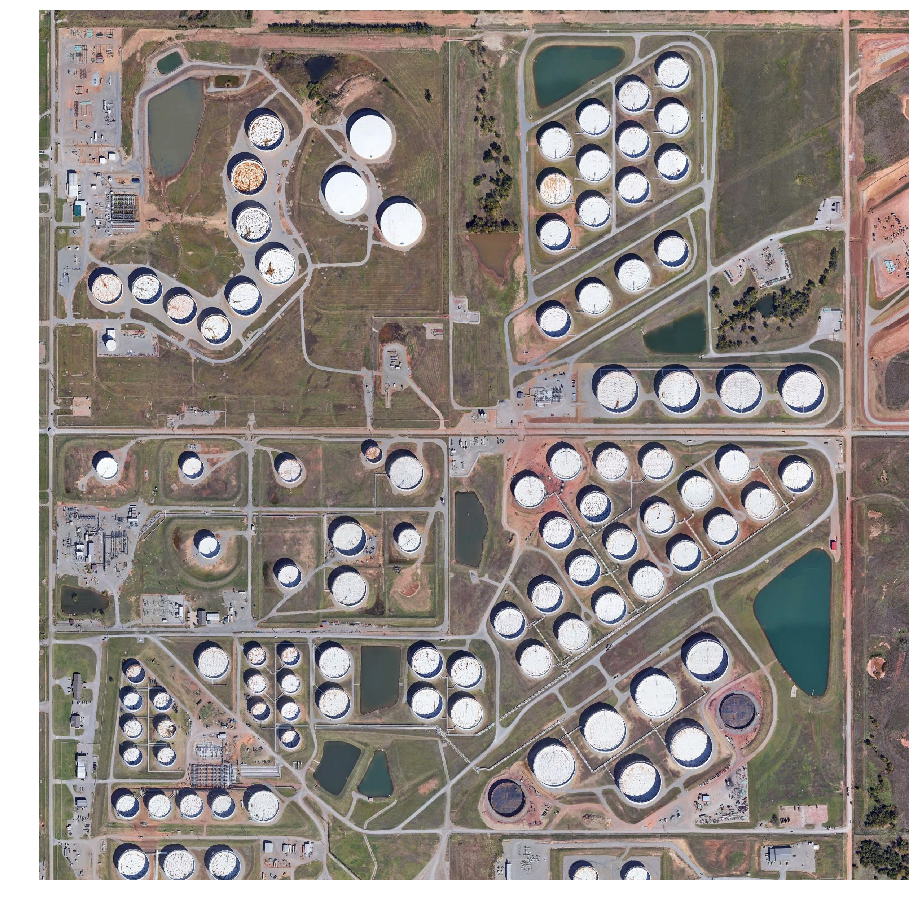

In [ ]:
imag = 'tank2.png'
img = cv2.imread(imag)
s=img.shape
imgg = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(img)

In [ ]:
hsv = color.rgb2hsv(img)
H = hsv[:,:,0]
S = hsv[:,:,1]
V = hsv[:,:,2]

lab = color.rgb2lab(img)
l1 = lab[:,:,0]
l2 = lab[:,:,1]
l3 = lab[:,:,2]

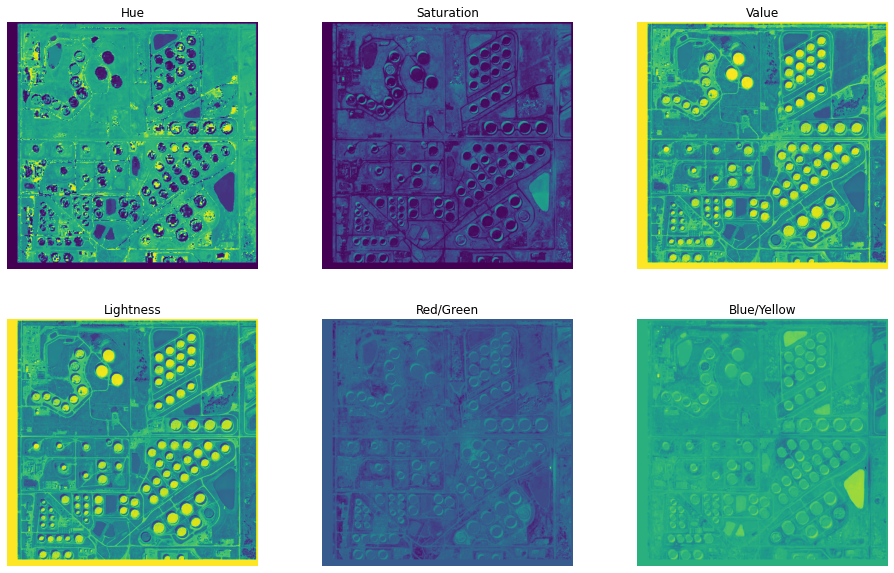

In [ ]:
fig, axes = plt.subplots(2, 3, figsize=(16,10))

axes[0][0].imshow(H)
axes[0][0].set_title('Hue')

axes[0][1].imshow(S)
axes[0][1].set_title('Saturation')

axes[0][2].imshow(V)
axes[0][2].set_title('Value')

axes[1][0].imshow(l1)
axes[1][0].set_title('Lightness')

axes[1][1].imshow(l2)
axes[1][1].set_title('Red/Green')

axes[1][2].imshow(l3)
axes[1][2].set_title('Blue/Yellow');

for ax in axes.flat:
    ax.axis('off')

In [ ]:
c1 = (H+1)/(V+1)
c2 = (S-V)/(S+V)
c3 = -(l1+l3)/(V+1)

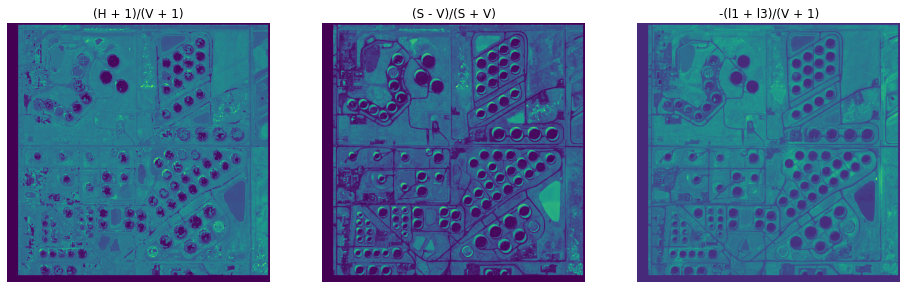

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(16,6))
axes[0].imshow(c1)
axes[0].set_title('(H + 1)/(V + 1)')
axes[1].imshow(c2)
axes[1].set_title('(S - V)/(S + V)')
axes[2].imshow(c3)
axes[2].set_title('-(l1 + l3)/(V + 1)');

for ax in axes.flat:
    ax.axis('off')

In [ ]:
t1 = filters.threshold_minimum(c3)
t2 = filters.threshold_mean(c3)

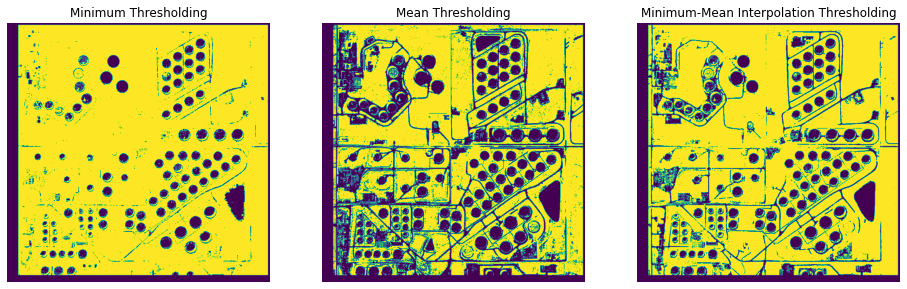

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(16,6))
axes[0].imshow(c3 > t1)
axes[0].set_title('Minimum Thresholding')
axes[1].imshow(c3 > t2)
axes[1].set_title('Mean Thresholding')
axes[2].imshow(c3 > (0.6*t1 + 0.4*t2))
axes[2].set_title('Minimum-Mean Interpolation Thresholding')

for ax in axes.flat:
    ax.axis('off')

In [ ]:
tank_thresh = c3 > (0.6*t1 + 0.4*t2)

label_1 = filters.hessian(tank_thresh)
label_2 = segmentation.clear_border(filters.hessian(tank_thresh))
label_3 = morphology.closing(segmentation.clear_border(filters.hessian(tank_thresh)))
label_4 = morphology.area_closing(morphology.closing(segmentation.clear_border(filters.hessian(tank_thresh))))
label_image = measure.label(morphology.area_closing(morphology.closing(
            segmentation.clear_border(filters.hessian(tank_thresh)))))

<ipython-input-59-c48c672abd20>:3: FutureWarning: Previously, hessian implicitly used 'constant' as the border mode when dealing with the edge of the array. The new behavior is 'reflect'. To recover the old behavior, use mode='constant'. To avoid this warning, please explicitly set the mode.
  label_1 = filters.hessian(tank_thresh)
<ipython-input-59-c48c672abd20>:4: FutureWarning: Previously, hessian implicitly used 'constant' as the border mode when dealing with the edge of the array. The new behavior is 'reflect'. To recover the old behavior, use mode='constant'. To avoid this warning, please explicitly set the mode.
  label_2 = segmentation.clear_border(filters.hessian(tank_thresh))
<ipython-input-59-c48c672abd20>:5: FutureWarning: Previously, hessian implicitly used 'constant' as the border mode when dealing with the edge of the array. The new behavior is 'reflect'. To recover the old behavior, use mode='constant'. To avoid this warning, please explicitly set the mode.
  label_3 = 

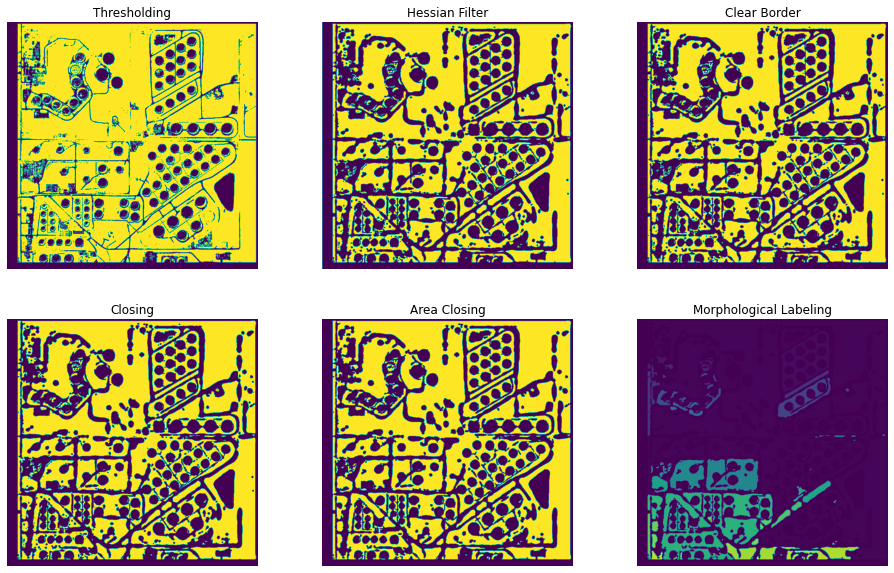

In [ ]:
fig, axes = plt.subplots(2, 3, figsize=(16,10))

axes[0][0].imshow(tank_thresh)
axes[0][0].set_title('Thresholding')
axes[0][1].imshow(label_1)
axes[0][1].set_title('Hessian Filter')
axes[0][2].imshow(label_2)
axes[0][2].set_title('Clear Border')
axes[1][0].imshow(label_3)
axes[1][0].set_title('Closing')
axes[1][1].imshow(label_4)
axes[1][1].set_title('Area Closing')
axes[1][2].imshow(label_image)
axes[1][2].set_title('Morphological Labeling')

for ax in axes.flat:
    ax.axis('off')

In [193]:
import numpy as np
import matplotlib.pyplot as plt

# read the image
img = cv2.imread(r"tank2.png", 0)
print(img)

[[255 255 255 255 ... 255 255 255 255]
 [255 255 255 255 ... 255 255 255 255]
 [255 255 255 255 ... 255 255 255 255]
 [255 255 255 255 ... 255 255 255 255]
 ...
 [255 255 255 255 ... 255 255 255 255]
 [255 255 255 255 ... 255 255 255 255]
 [255 255 255 255 ... 255 255 255 255]
 [255 255 255 255 ... 255 255 255 255]]


# Erosion
Erosion primarily involves eroding the outer surface (the foreground) of the image. As binary images only contain two pixels 0 and 255, it primarily involves eroding the foreground of the image and it is suggested to have the foreground as white. The thickness of erosion depends on the size and shape of the defined kernel.

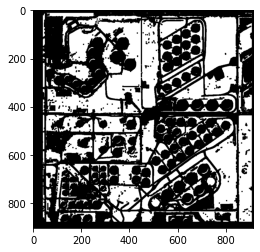

In [194]:
binr = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]
# define the kernel
kernel = np.ones((5, 5), np.uint8)
  
# invert the image
invert = cv2.bitwise_not(binr)
  
# erode the image
erosion = cv2.erode(invert, kernel,
                    iterations=1)
  
# print the output
plt.imshow(erosion, cmap='gray')

# Closing
Closing involves dilation followed by erosion in the outer surface (the foreground) of the image. All the above-said constraints for erosion and dilation applies here. It is a blend of the two prime methods. It is generally used to remove the noise in the image.

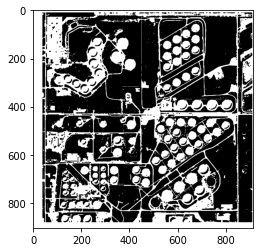

In [195]:
# define the kernel
kernel = np.ones((3, 3), np.uint8)
  
# opening the image
closing = cv2.morphologyEx(binr, cv2.MORPH_CLOSE, kernel, iterations=1)
  
# print the output
plt.imshow(closing, cmap='gray')

# Top Hat
Top Hat is yet another morphological operation where Opening is performed on the binary image and the output of this operation is a difference between the input image and the opened image. 



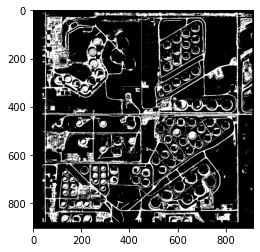

In [196]:
# define the kernel
kernel = np.ones((13, 13), np.uint8)
  
# use morph gradient
morph_gradient = cv2.morphologyEx(binr,
                                  cv2.MORPH_TOPHAT,
                                  kernel)
# print the output
plt.imshow(morph_gradient, cmap='gray')

In [197]:
from PIL import Image,ImageFilter

In [198]:
filename = "tank2.png"
with Image.open(filename) as Img:
  Img.load()
type(Img)
isinstance(Img, Image.Image)

True

An algorithm to detect edges automatically using edge detection kernels, the ImageFilter module in Pillow has a predefined kernel to achieve this.

We convert the tank image to grayscale before you apply the edge detection filter.

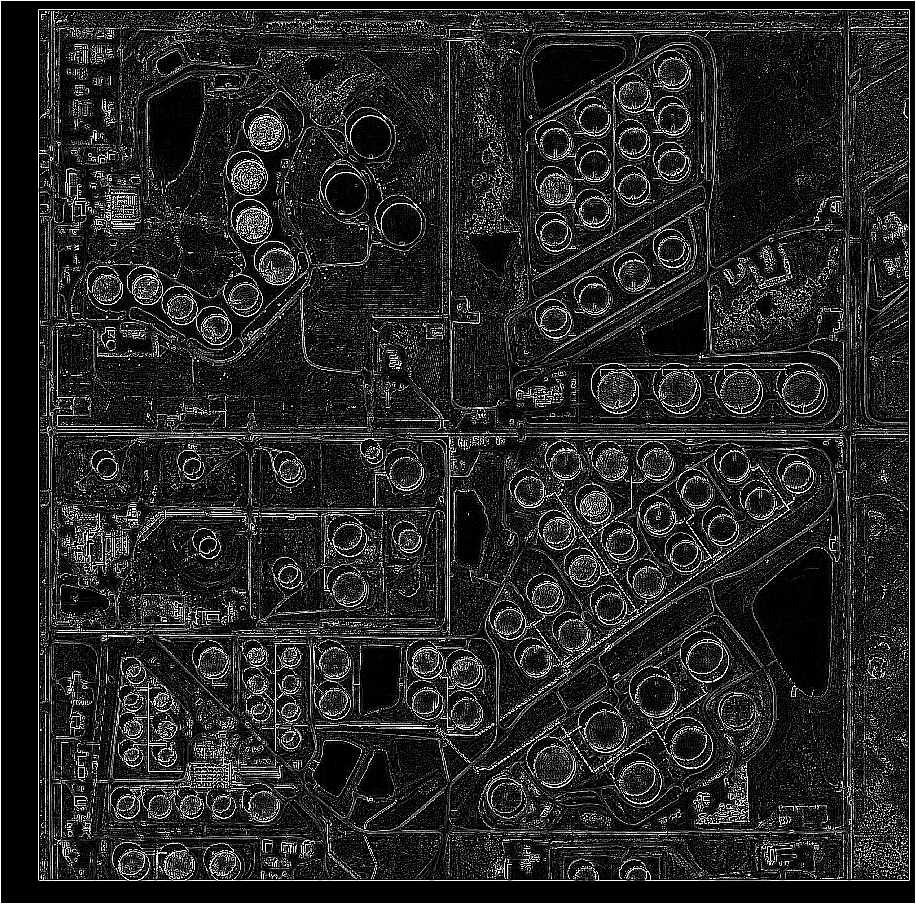

In [199]:
img_gray = Img.convert("L")
edges = img_gray.filter(ImageFilter.FIND_EDGES)
edges

This filter identifies the edges in the image. You can obtain a better outcome by applying the ImageFilter.SMOOTH filter before finding the edges:

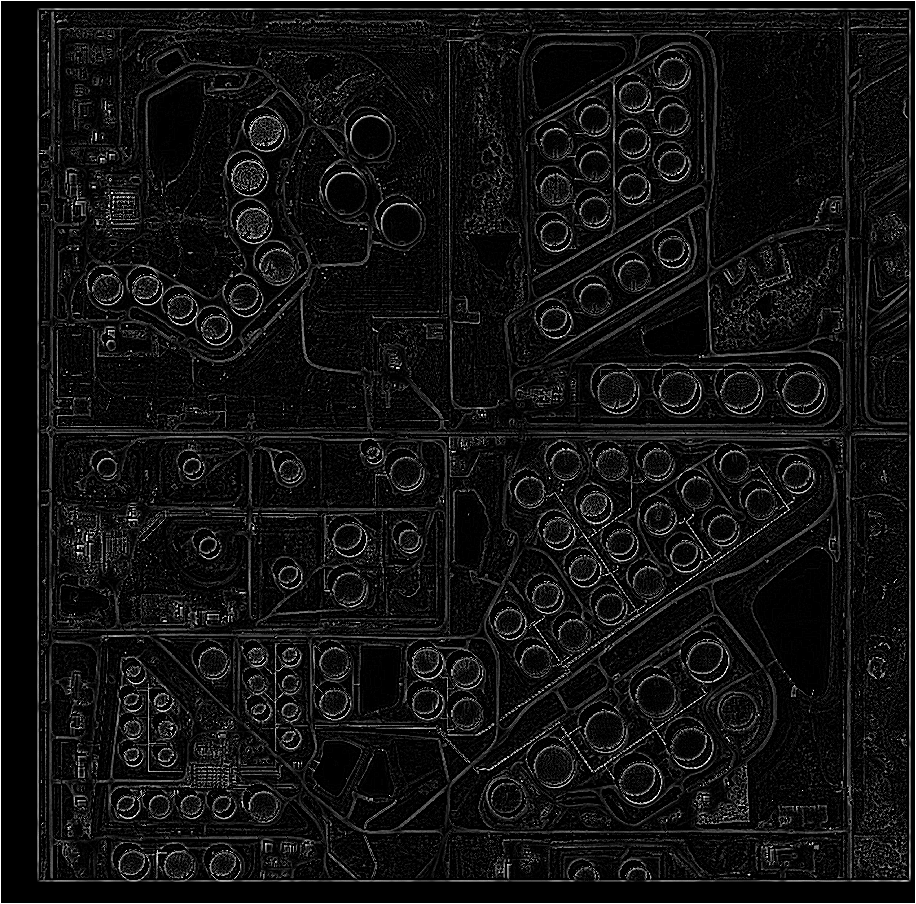

In [200]:
img_gray_smooth = img_gray.filter(ImageFilter.SMOOTH)
edges_smooth = img_gray_smooth.filter(ImageFilter.FIND_EDGES)
edges_smooth

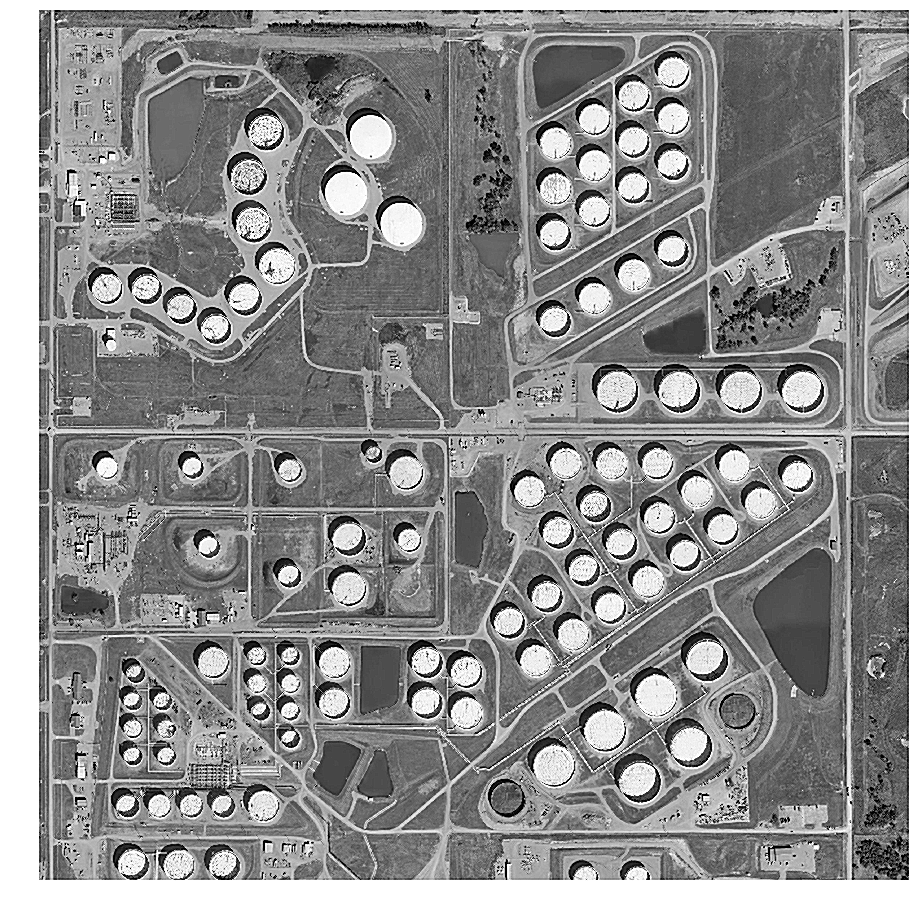

In [201]:
edge_enhance = img_gray_smooth.filter(ImageFilter.EDGE_ENHANCE)
edge_enhance

# Image 3

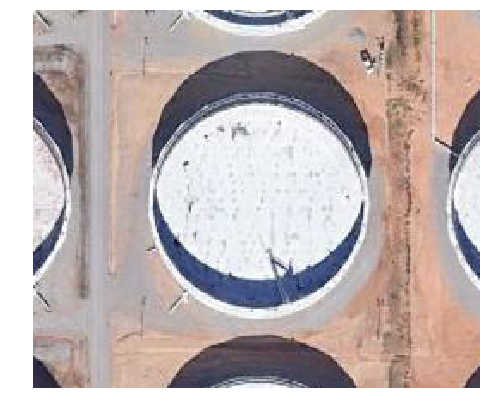

In [202]:
imag = 'tank1.png'
img = cv2.imread(imag)
s=img.shape
imgg = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(img)

In [203]:
hsv = color.rgb2hsv(img)
H = hsv[:,:,0]
S = hsv[:,:,1]
V = hsv[:,:,2]

lab = color.rgb2lab(img)
l1 = lab[:,:,0]
l2 = lab[:,:,1]
l3 = lab[:,:,2]

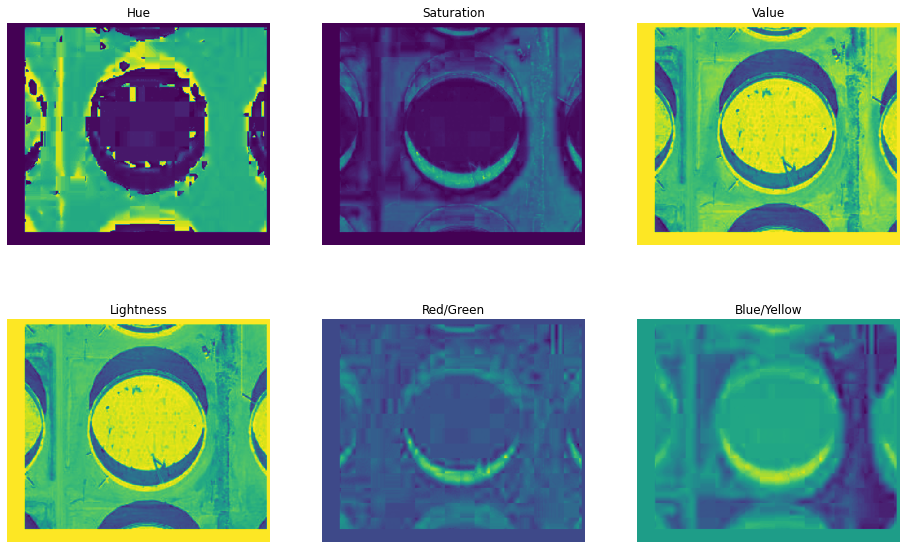

In [204]:
fig, axes = plt.subplots(2, 3, figsize=(16,10))

axes[0][0].imshow(H)
axes[0][0].set_title('Hue')

axes[0][1].imshow(S)
axes[0][1].set_title('Saturation')

axes[0][2].imshow(V)
axes[0][2].set_title('Value')

axes[1][0].imshow(l1)
axes[1][0].set_title('Lightness')

axes[1][1].imshow(l2)
axes[1][1].set_title('Red/Green')

axes[1][2].imshow(l3)
axes[1][2].set_title('Blue/Yellow');

for ax in axes.flat:
    ax.axis('off')

In [205]:
c1 = (H+1)/(V+1)
c2 = (S-V)/(S+V)
c3 = -(l1+l3)/(V+1)

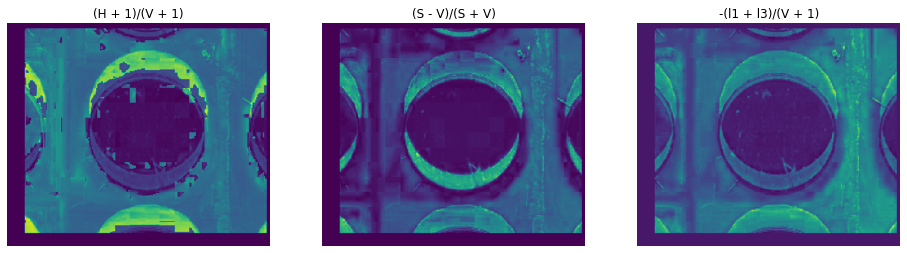

In [206]:
fig, axes = plt.subplots(1, 3, figsize=(16,6))
axes[0].imshow(c1)
axes[0].set_title('(H + 1)/(V + 1)')
axes[1].imshow(c2)
axes[1].set_title('(S - V)/(S + V)')
axes[2].imshow(c3)
axes[2].set_title('-(l1 + l3)/(V + 1)');

for ax in axes.flat:
    ax.axis('off')

In [207]:
t1 = filters.threshold_minimum(c3)
t2 = filters.threshold_mean(c3)

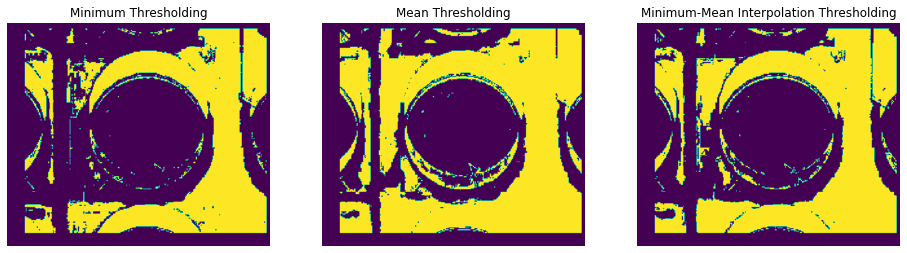

In [208]:
fig, axes = plt.subplots(1, 3, figsize=(16,6))
axes[0].imshow(c3 > t1)
axes[0].set_title('Minimum Thresholding')
axes[1].imshow(c3 > t2)
axes[1].set_title('Mean Thresholding')
axes[2].imshow(c3 > (0.6*t1 + 0.4*t2))
axes[2].set_title('Minimum-Mean Interpolation Thresholding')

for ax in axes.flat:
    ax.axis('off')

In [209]:
tank_thresh = c3 > (0.6*t1 + 0.4*t2)

label_1 = filters.hessian(tank_thresh)
label_2 = segmentation.clear_border(filters.hessian(tank_thresh))
label_3 = morphology.closing(segmentation.clear_border(filters.hessian(tank_thresh)))
label_4 = morphology.area_closing(morphology.closing(segmentation.clear_border(filters.hessian(tank_thresh))))
label_image = measure.label(morphology.area_closing(morphology.closing(
            segmentation.clear_border(filters.hessian(tank_thresh)))))

<ipython-input-209-c48c672abd20>:3: FutureWarning: Previously, hessian implicitly used 'constant' as the border mode when dealing with the edge of the array. The new behavior is 'reflect'. To recover the old behavior, use mode='constant'. To avoid this warning, please explicitly set the mode.
  label_1 = filters.hessian(tank_thresh)
<ipython-input-209-c48c672abd20>:4: FutureWarning: Previously, hessian implicitly used 'constant' as the border mode when dealing with the edge of the array. The new behavior is 'reflect'. To recover the old behavior, use mode='constant'. To avoid this warning, please explicitly set the mode.
  label_2 = segmentation.clear_border(filters.hessian(tank_thresh))
<ipython-input-209-c48c672abd20>:5: FutureWarning: Previously, hessian implicitly used 'constant' as the border mode when dealing with the edge of the array. The new behavior is 'reflect'. To recover the old behavior, use mode='constant'. To avoid this warning, please explicitly set the mode.
  label_3

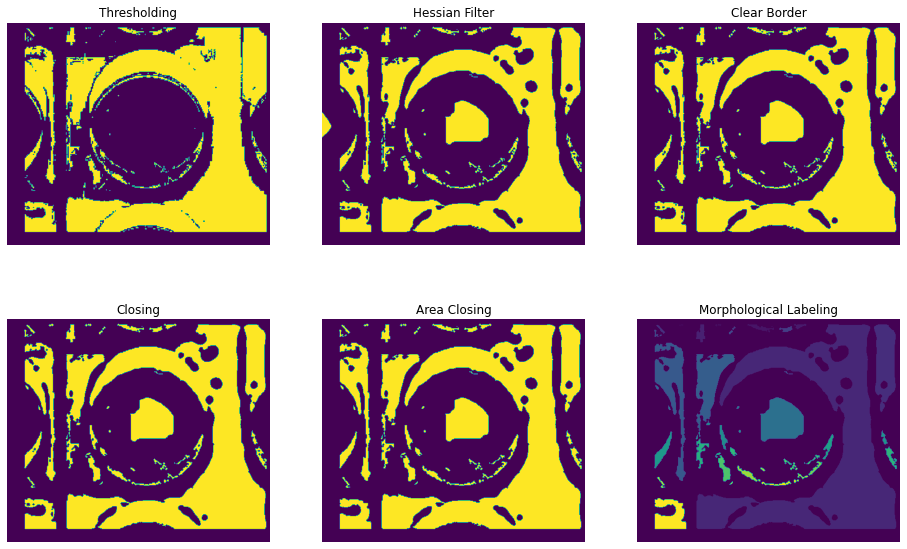

In [210]:
fig, axes = plt.subplots(2, 3, figsize=(16,10))

axes[0][0].imshow(tank_thresh)
axes[0][0].set_title('Thresholding')
axes[0][1].imshow(label_1)
axes[0][1].set_title('Hessian Filter')
axes[0][2].imshow(label_2)
axes[0][2].set_title('Clear Border')
axes[1][0].imshow(label_3)
axes[1][0].set_title('Closing')
axes[1][1].imshow(label_4)
axes[1][1].set_title('Area Closing')
axes[1][2].imshow(label_image)
axes[1][2].set_title('Morphological Labeling')

for ax in axes.flat:
    ax.axis('off')

In [211]:
import numpy as np
import matplotlib.pyplot as plt

# read the image
img = cv2.imread(r"tank1.png", 0)
print(img)

[[255 255 255 255 ... 255 255 255 255]
 [255 255 255 255 ... 255 255 255 255]
 [255 255 255 255 ... 255 255 255 255]
 [255 255 255 255 ... 255 255 255 255]
 ...
 [255 255 255 255 ... 255 255 255 255]
 [255 255 255 255 ... 255 255 255 255]
 [255 255 255 255 ... 255 255 255 255]
 [255 255 255 255 ... 255 255 255 255]]


# Erosion
Erosion primarily involves eroding the outer surface (the foreground) of the image. As binary images only contain two pixels 0 and 255, it primarily involves eroding the foreground of the image and it is suggested to have the foreground as white. The thickness of erosion depends on the size and shape of the defined kernel.

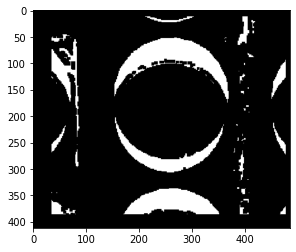

In [212]:
binr = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]
# define the kernel
kernel = np.ones((5, 5), np.uint8)
  
# invert the image
invert = cv2.bitwise_not(binr)
  
# erode the image
erosion = cv2.erode(invert, kernel,
                    iterations=1)
  
# print the output
plt.imshow(erosion, cmap='gray')

# Closing
Closing involves dilation followed by erosion in the outer surface (the foreground) of the image. All the above-said constraints for erosion and dilation applies here. It is a blend of the two prime methods. It is generally used to remove the noise in the image.

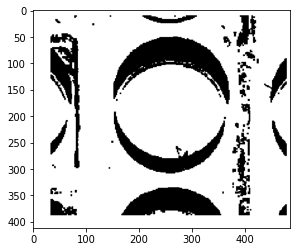

In [213]:
# define the kernel
kernel = np.ones((3, 3), np.uint8)
  
# opening the image
closing = cv2.morphologyEx(binr, cv2.MORPH_CLOSE, kernel, iterations=1)
  
# print the output
plt.imshow(closing, cmap='gray')

# Top Hat
Top Hat is yet another morphological operation where Opening is performed on the binary image and the output of this operation is a difference between the input image and the opened image. 



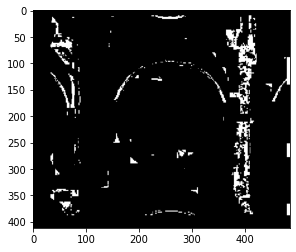

In [214]:
# define the kernel
kernel = np.ones((13, 13), np.uint8)
  
# use morph gradient
morph_gradient = cv2.morphologyEx(binr,
                                  cv2.MORPH_TOPHAT,
                                  kernel)
# print the output
plt.imshow(morph_gradient, cmap='gray')

In [215]:
from PIL import Image,ImageFilter

In [216]:
filename = "tank1.png"
with Image.open(filename) as Img:
  Img.load()
type(Img)
isinstance(Img, Image.Image)

True

An algorithm to detect edges automatically using edge detection kernels, the ImageFilter module in Pillow has a predefined kernel to achieve this.

We convert the tank image to grayscale before you apply the edge detection filter.

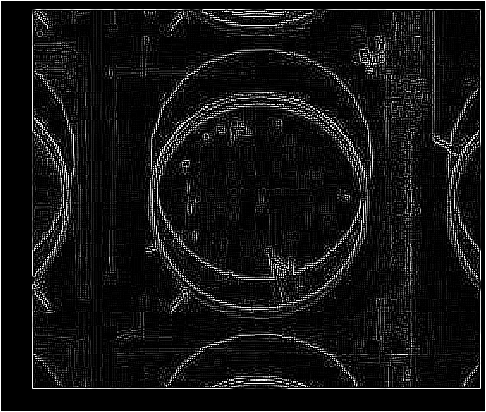

In [217]:
img_gray = Img.convert("L")
edges = img_gray.filter(ImageFilter.FIND_EDGES)
edges

This filter identifies the edges in the image. You can obtain a better outcome by applying the ImageFilter.SMOOTH filter before finding the edges:

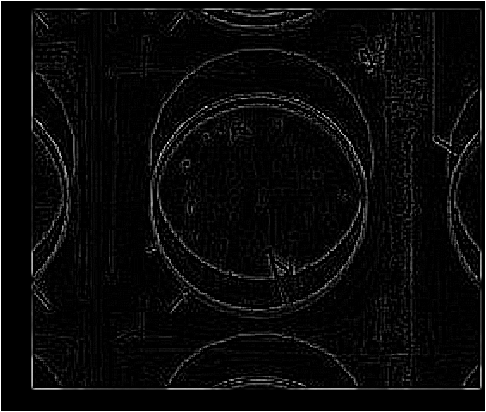

In [218]:
img_gray_smooth = img_gray.filter(ImageFilter.SMOOTH)
edges_smooth = img_gray_smooth.filter(ImageFilter.FIND_EDGES)
edges_smooth

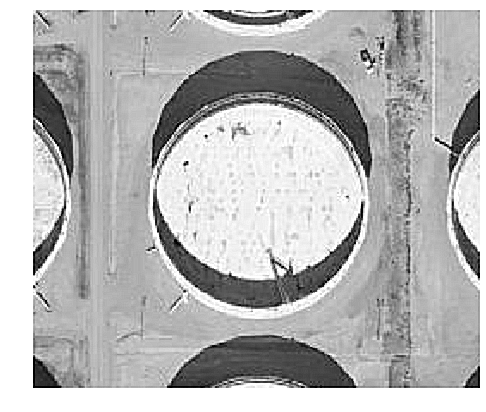

In [219]:
edge_enhance = img_gray_smooth.filter(ImageFilter.EDGE_ENHANCE)
edge_enhance

# Image Segmentation Using Thresholding


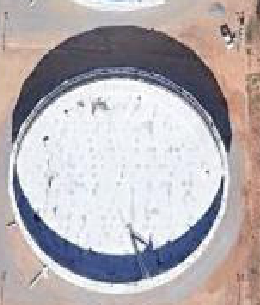

In [ ]:
filename_cat = "tank1.png"

with Image.open(filename_cat) as Img:
  Img.load()

Img = Img.crop((140, 25, 400, 330))
Img= Img.convert('RGB')
Img

In [ ]:
red, green, blue= Img.split()

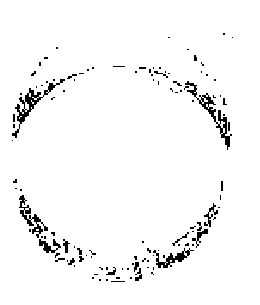

In [ ]:
threshold = 57
img_threshold = red.point(lambda x: 255 if x > threshold else 0)
img_threshold = img_threshold.convert("1")
img_threshold

In [ ]:
def erode(cycles, image):
  for _ in range(cycles):
    image = image.filter(ImageFilter.MinFilter(3))
  return image

def dilate(cycles, image):
   for _ in range(cycles):
     image = image.filter(ImageFilter.MaxFilter(3))
   return image

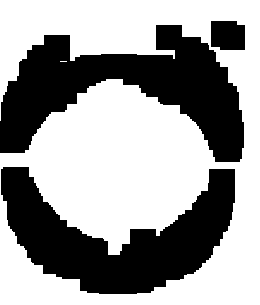

In [ ]:
step_1 = erode(12, img_threshold)
step_1

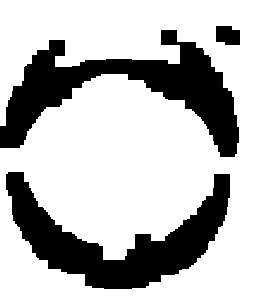

In [ ]:
step_2 = dilate(5, step_1)
step_2

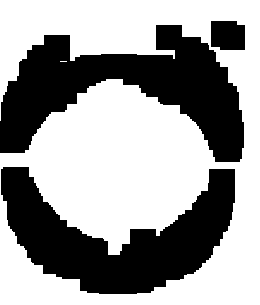

In [ ]:
mask = erode(5, step_2)
mask

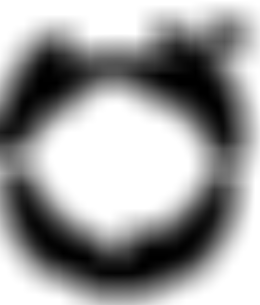

In [ ]:
mask = mask.convert("L")
mask = mask.filter(ImageFilter.BoxBlur(20))
mask